In [1]:
# Importing packages
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torchmetrics
import torchinfo
import torch.nn.functional as F
import cv2

In [2]:
# Data pathes
train_images = 'data/Massachusetts/tiff/train'
train_labels = 'data/Massachusetts/tiff/train_labels'
val_images = 'data/Massachusetts/tiff/val'
val_labels = 'data/Massachusetts/tiff/val_labels'
test_images = 'data/Massachusetts/tiff/test'
test_labels = 'data/Massachusetts/tiff/test_labels'

In [3]:
# Hyperparams
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
IN_CHANNELS = 3
CLASSES = 2
TRAIN_BATCH = 8
VALID_BATCH = 2
NUM_WORKERS = 8
LR = 0.001
EPOCHS = 100

In [4]:
# Train and test augmentations

A_train = A.Compose([#A.Resize(224, 224, interpolation=cv2.INTER_NEAREST), 
                     A.RandomCrop(height=256, width=256, always_apply=True),
                     A.OneOf([
                       A.VerticalFlip(p=1),
                       A.HorizontalFlip(p=1),
                       A.RandomRotate90(p=1)], p=1),  
#                     A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                     A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
                  ToTensorV2()])


A_val =  A.Compose([ #A.Resize(224, 224, interpolation=cv2.INTER_NEAREST),
                    A.PadIfNeeded(min_height=1552, min_width=1552, always_apply=True, border_mode=0),
                   A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
#                      A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                    
                   ToTensorV2()])

In [5]:
# Dataset class
class MassachussetsDataset(Dataset):
    def __init__(self, img_path, mask_path, transforms=None):
        super().__init__()
        self.img_path = img_path
        self.mask_path = mask_path
        self.transforms = transforms
        self.images_list = os.listdir(img_path)

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, index):
        image = np.array(Image.open(os.path.join(self.img_path, self.images_list[index])).convert("RGB"))
        mask = np.array(Image.open(os.path.join(self.mask_path, self.images_list[index].replace('.tiff', '.tif'))).convert("L"), dtype=np.float32)
        mask[mask==255] = 1.0

        if self.transforms is not None:
            aug  = self.transforms(image=image, mask=mask)
            image = aug['image']
            mask = aug['mask']
            

        return image, mask

In [6]:
# Datasets and Dataloaders

train_set = MassachussetsDataset(train_images, train_labels, transforms=A_train)
valid_set = MassachussetsDataset(val_images, val_labels, transforms=A_val)
test_set = MassachussetsDataset(test_images, test_labels, transforms=A_val)


train_loader = DataLoader(train_set, shuffle=True, batch_size=TRAIN_BATCH, num_workers=NUM_WORKERS)
valid_loader = DataLoader(valid_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)
test_loader = DataLoader(test_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)

In [7]:
# def get_mean_and_std(dataloader):
#     channels_sum, channels_squared_sum, num_batches = 0, 0, 0
#     for data, _ in dataloader:
#         # Mean over batch, height and width, but not over the channels
#         channels_sum += torch.mean(data, dim=[0,2,3])
#         channels_squared_sum += torch.mean(data**2, dim=[0,2,3])
#         num_batches += 1
    
#     mean = channels_sum / num_batches

#     # std = sqrt(E[X^2] - (E[X])^2)
#     std = (channels_squared_sum / num_batches - mean ** 2) ** 0.5

#     return mean, std

# mean, std = get_mean_and_std(train_loader)

In [8]:
# print(mean)
# print(std)

In [9]:
img, mask = train_set[2]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


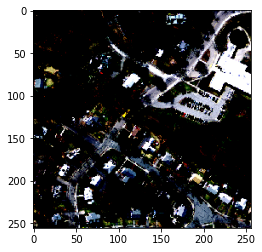

In [10]:
plt.imshow(img.permute(1, 2, 0))

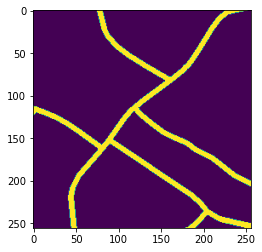

In [11]:
plt.imshow(mask)

In [12]:
print(np.unique(mask))

[0. 1.]


In [13]:
import torch 
import torch.nn as nn
from torch.nn.modules.conv import Conv2d

# Skip connection 
class Residual(nn.Module):
    def __init__(self, fn):
        super(Residual, self).__init__()
        self.fn = fn

    def forward(self, x):
        return self.fn(x) + x


# In this block we have n depth and in_dim and out_dim is equal. We will use it for the path aggregation.
def ConvMixer_Path(dim, depth, kernel_size=3, padding=1):
    return nn.Sequential(
        *[nn.Sequential(
            Residual(nn.Sequential(
                nn.Conv2d(dim, dim, kernel_size=kernel_size, groups=dim, padding=padding),
                nn.BatchNorm2d(dim),
                nn.ReLU(),
                
            )),
            nn.Conv2d(dim, dim, kernel_size=1),
            nn.BatchNorm2d(dim),
            nn.ReLU(),
            
        ) for i in range(depth)]
    )

# In this block the depth is 1 and in_dim and out_dim is different. We will use this block in every stage of the U_Net
def ConvMixer_Block(in_dim, out_dim, kernel_size=3, padding=1):
    return nn.Sequential(
            Residual(nn.Sequential(
                nn.Conv2d(in_dim, in_dim, kernel_size=kernel_size, groups=in_dim, padding=padding),
                nn.BatchNorm2d(in_dim),
                nn.ReLU()
            )),
            nn.Conv2d(in_dim, out_dim, kernel_size=1),
        nn.BatchNorm2d(out_dim),    
        nn.ReLU()
    )


class DepthWiseInceptionBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        self.conv1 = nn.Conv2d(in_channels, int(out_channels/4), kernel_size=1)
        self.conv3 = ConvMixer_Block(in_channels, int(out_channels/4))
        self.conv5 = nn.Sequential(ConvMixer_Block(in_channels, int(out_channels/4)),
                                    ConvMixer_Block(int(out_channels/4), int(out_channels/4)))
        self.conv7 = nn.Sequential(ConvMixer_Block(in_channels, int(out_channels/4)),
                                    ConvMixer_Block(int(out_channels/4), int(out_channels/4)),
                                    ConvMixer_Block(int(out_channels/4), int(out_channels/4)))
        self.relu = nn.ReLU()
        self.batchnorm = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        a = self.conv1(x)
        b = self.conv3(x)
        c = self.conv5(x)
        d = self.conv7(x)

        cat = torch.cat([a, b, c, d], dim=1)
        x = self.batchnorm(cat)
        out = self.relu(cat)
       

        return out
#######################################



class ConvMixer_UNET_down(nn.Module):
    def __init__(self, num_classes):
        super(ConvMixer_UNET_down, self).__init__()
        self.num_classes = num_classes
        # Encoder Stage 1
        self.E_S1 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1, stride=1),
                                  nn.BatchNorm2d(64),
                                  nn.ReLU(),
                                  DepthWiseInceptionBlock(64, 64))
        self.S1_path = ConvMixer_Path(64, 4)
        # self.S1_path_aggregate = Conv2d(64, 128, kernel_size=1) # The bottleneck layer that connects 1st stage path layer with second stage path

        self.E_S2 = nn.Sequential(DepthWiseInceptionBlock(64, 128),
                                  DepthWiseInceptionBlock(128, 128))

        self.S2_path = ConvMixer_Path(128, 3)
        # self.S2_path_aggregate = Conv2d(128, 256, kernel_size=1)

        self.E_S3 = nn.Sequential(DepthWiseInceptionBlock(128, 256),
                                  DepthWiseInceptionBlock(256, 256))

        self.S3_path = ConvMixer_Path(256, 2)
        # self.S3_path_aggregate = Conv2d(256, 512, kernel_size=1)

        self.E_S4 = nn.Sequential(DepthWiseInceptionBlock(256, 512),
                                  DepthWiseInceptionBlock(512, 512))

        self.S4_path = ConvMixer_Path(512, 1)

        self.bridge = nn.Sequential(DepthWiseInceptionBlock(512, 1024),
                                    DepthWiseInceptionBlock(1024, 512))


        self.S4_up = nn.Sequential(#nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=1),
                                   nn.UpsamplingBilinear2d(scale_factor=2))
        self.S3_up = nn.Sequential(#nn.Conv2d(in_channels=512, out_channels=256, kernel_size=1),
                                   nn.UpsamplingBilinear2d(scale_factor=2))
        self.S2_up = nn.Sequential(#nn.Conv2d(in_channels=256, out_channels=128, kernel_size=1),
                                   nn.UpsamplingBilinear2d(scale_factor=2))
        self.S1_up = nn.Sequential(#nn.Conv2d(in_channels=128, out_channels=64, kernel_size=1),
                                   nn.UpsamplingBilinear2d(scale_factor=2))



        self.D_S4 = nn.Sequential(DepthWiseInceptionBlock(1024, 512),
                                    DepthWiseInceptionBlock(512, 256))

        self.D_S3 = nn.Sequential(DepthWiseInceptionBlock(512,256),
                                    DepthWiseInceptionBlock(256, 128))

        self.D_S2 = nn.Sequential(DepthWiseInceptionBlock(256, 128),
                                    DepthWiseInceptionBlock(128, 64))

        self.D_S1 = nn.Sequential(DepthWiseInceptionBlock(128, 64),
                                    DepthWiseInceptionBlock(64, 64))


        self.max_pool = nn.MaxPool2d(2, 2)

        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        e_s1_out = self.E_S1(x)
        s1_path_out = self.S1_path(e_s1_out)
        # s1_path_aggregation = self.S1_path_aggregate(self.max_pool(s1_path_out)) # this is the block that accepts 1st layer path output and maxpools it and then increases the number of channels twice to concatenate with second layer
        x = self.max_pool(e_s1_out) 

        e_s2_out = self.E_S2(x)
        s2_path_out = self.S2_path(e_s2_out)
        # s2_path_aggregation = self.S2_path_aggregate(self.max_pool(s2_path_out))
        x = self.max_pool(e_s2_out)

        e_s3_out = self.E_S3(x)
        s3_path_out = self.S3_path(e_s3_out)
        # s3_path_aggregation = self.S3_path_aggregate(self.max_pool(s3_path_out))
        x = self.max_pool(e_s3_out)

        e_s4_out = self.E_S4(x)
        s4_path_out =self.S4_path(e_s4_out)
        x = self.max_pool(e_s4_out)
        
        bridge = self.bridge(x)

        s4_up = self.S4_up(bridge)
        cat = torch.cat([s4_up, s4_path_out], dim=1)
        d4_out = self.D_S4(cat)

        s3_up = self.S3_up(d4_out)
        cat = torch.cat([s3_up, s3_path_out], dim=1)
        d3_out = self.D_S3(cat)

        s2_up = self.S2_up(d3_out)
        cat = torch.cat([s2_up, s2_path_out], dim=1)
        d2_out = self.D_S2(cat)

        s1_up = self.S1_up(d2_out)
        cat = torch.cat([s1_up, s1_path_out], dim=1)
        d1_out = self.D_S1(cat)

        out = self.final(d1_out)  

        return out

In [14]:
model = ConvMixer_UNET_down(CLASSES).to(DEVICE)

In [15]:
# Custom loss functions
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice
    
#####################################################################################    
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE
#####################################################################################    
class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoULoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = (intersection + smooth)/(union + smooth)
                
        return 1 - IoU
    
#####################################################################################    
ALPHA = 0.8
GAMMA = 2

class FocalLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(FocalLoss, self).__init__()

    def forward(self, inputs, targets, alpha=0.8, gamma=2, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #first compute binary cross-entropy 
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        BCE_EXP = torch.exp(-BCE)
        focal_loss = alpha * (1-BCE_EXP)**gamma * BCE
                       
        return focal_loss
    
    
#####################################################################################
ALPHA = 0.5
BETA = 0.5

class TverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(TverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=ALPHA, beta=BETA):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()    
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
       
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        
        return 1 - Tversky

In [16]:
# criterion = nn.BCEWithLogitsLoss().to(DEVICE)
# criterion = DiceLoss().to(DEVICE)
criterion = DiceBCELoss().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)

In [17]:
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=CLASSES):
    with torch.no_grad():
        pred_mask = nn.functional.sigmoid(pred_mask)
        pred_mask = (pred_mask > 0.5).float()
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union + smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

In [18]:
def plot_images(img, mask, pred):
    f, ax = plt.subplots(1, 3)
    ax[0].imshow(img)
    ax[0].set_xlabel("Image")
    ax[1].imshow(mask)
    ax[1].set_xlabel("Ground Truth")
    ax[2].imshow(pred)
    ax[2].set_xlabel("Prediction")

  0%|          | 0/139 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.829, valid_miou=0.609]


Epoch-1 Train mean loss: 1.0121 Train MIOU: 0.5417
Epoch-1 Valid mean loss: 0.7556 Valid MIOU: 0.6287


100%|██████████| 7/7 [00:09<00:00,  1.34s/it, valid_loss=0.645, valid_miou=0.669]


Epoch-2 Train mean loss: 0.7520 Train MIOU: 0.6255
Epoch-2 Valid mean loss: 0.6440 Valid MIOU: 0.6716


100%|██████████| 7/7 [00:09<00:00,  1.33s/it, valid_loss=0.642, valid_miou=0.68] 


Epoch-3 Train mean loss: 0.6556 Train MIOU: 0.6632
Epoch-3 Valid mean loss: 0.5681 Valid MIOU: 0.7051


100%|██████████| 7/7 [00:09<00:00,  1.34s/it, valid_loss=0.652, valid_miou=0.675]


Epoch-4 Train mean loss: 0.6050 Train MIOU: 0.6831
Epoch-4 Valid mean loss: 0.5522 Valid MIOU: 0.7136


100%|██████████| 7/7 [00:09<00:00,  1.33s/it, valid_loss=0.616, valid_miou=0.707]


Epoch-5 Train mean loss: 0.5597 Train MIOU: 0.7034
Epoch-5 Valid mean loss: 0.5060 Valid MIOU: 0.7308


100%|██████████| 7/7 [00:09<00:00,  1.33s/it, valid_loss=0.448, valid_miou=0.75] 


Epoch-6 Train mean loss: 0.5701 Train MIOU: 0.6980
Epoch-6 Valid mean loss: 0.5119 Valid MIOU: 0.7304


100%|██████████| 7/7 [00:09<00:00,  1.35s/it, valid_loss=0.343, valid_miou=0.787]


Epoch-7 Train mean loss: 0.5390 Train MIOU: 0.7124
Epoch-7 Valid mean loss: 0.4577 Valid MIOU: 0.7523


100%|██████████| 7/7 [00:09<00:00,  1.34s/it, valid_loss=0.539, valid_miou=0.713]


Epoch-8 Train mean loss: 0.5340 Train MIOU: 0.7141
Epoch-8 Valid mean loss: 0.4865 Valid MIOU: 0.7394


100%|██████████| 7/7 [00:09<00:00,  1.35s/it, valid_loss=0.55, valid_miou=0.732] 


Epoch-9 Train mean loss: 0.5090 Train MIOU: 0.7262
Epoch-9 Valid mean loss: 0.4911 Valid MIOU: 0.7364


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.442, valid_miou=0.749]


Epoch-10 Train mean loss: 0.5262 Train MIOU: 0.7161
Epoch-10 Valid mean loss: 0.4994 Valid MIOU: 0.7304


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.557, valid_miou=0.723]


Epoch-11 Train mean loss: 0.5007 Train MIOU: 0.7272
Epoch-11 Valid mean loss: 0.4415 Valid MIOU: 0.7605


100%|██████████| 7/7 [00:09<00:00,  1.34s/it, valid_loss=0.518, valid_miou=0.739]


Epoch-12 Train mean loss: 0.5329 Train MIOU: 0.7156
Epoch-12 Valid mean loss: 0.4670 Valid MIOU: 0.7476


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.491, valid_miou=0.733]


Epoch-13 Train mean loss: 0.4993 Train MIOU: 0.7286
Epoch-13 Valid mean loss: 0.4932 Valid MIOU: 0.7332


100%|██████████| 7/7 [00:09<00:00,  1.37s/it, valid_loss=0.415, valid_miou=0.771]


Epoch-14 Train mean loss: 0.5123 Train MIOU: 0.7236
Epoch-14 Valid mean loss: 0.4266 Valid MIOU: 0.7666


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.533, valid_miou=0.694]


Epoch-15 Train mean loss: 0.5020 Train MIOU: 0.7270
Epoch-15 Valid mean loss: 0.4618 Valid MIOU: 0.7513


100%|██████████| 7/7 [00:09<00:00,  1.37s/it, valid_loss=0.397, valid_miou=0.759]


Epoch-16 Train mean loss: 0.4919 Train MIOU: 0.7322
Epoch-16 Valid mean loss: 0.4416 Valid MIOU: 0.7589


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.431, valid_miou=0.772]


Epoch-17 Train mean loss: 0.4776 Train MIOU: 0.7383
Epoch-17 Valid mean loss: 0.4494 Valid MIOU: 0.7564


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.407, valid_miou=0.774]


Epoch-18 Train mean loss: 0.4858 Train MIOU: 0.7337
Epoch-18 Valid mean loss: 0.4260 Valid MIOU: 0.7674


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.293, valid_miou=0.813]


Epoch-19 Train mean loss: 0.4750 Train MIOU: 0.7393
Epoch-19 Valid mean loss: 0.4198 Valid MIOU: 0.7704


100%|██████████| 7/7 [00:10<00:00,  1.53s/it, valid_loss=0.325, valid_miou=0.806]


Epoch-20 Train mean loss: 0.4792 Train MIOU: 0.7385
Epoch-20 Valid mean loss: 0.4271 Valid MIOU: 0.7668


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.56, valid_miou=0.735] 


Epoch-21 Train mean loss: 0.4741 Train MIOU: 0.7401
Epoch-21 Valid mean loss: 0.4209 Valid MIOU: 0.7698


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.386, valid_miou=0.763]


Epoch-22 Train mean loss: 0.4873 Train MIOU: 0.7355
Epoch-22 Valid mean loss: 0.4873 Valid MIOU: 0.7376


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.476, valid_miou=0.739]


Epoch-23 Train mean loss: 0.4735 Train MIOU: 0.7397
Epoch-23 Valid mean loss: 0.4339 Valid MIOU: 0.7628


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.41, valid_miou=0.76]  


Epoch-24 Train mean loss: 0.4709 Train MIOU: 0.7397
Epoch-24 Valid mean loss: 0.4305 Valid MIOU: 0.7630


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.36, valid_miou=0.794] 


Epoch-25 Train mean loss: 0.4778 Train MIOU: 0.7389
Epoch-25 Valid mean loss: 0.4093 Valid MIOU: 0.7746


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.318, valid_miou=0.802]


Epoch-26 Train mean loss: 0.4631 Train MIOU: 0.7454
Epoch-26 Valid mean loss: 0.4067 Valid MIOU: 0.7754


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.389, valid_miou=0.788]


Epoch-27 Train mean loss: 0.4721 Train MIOU: 0.7406
Epoch-27 Valid mean loss: 0.4233 Valid MIOU: 0.7684


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.421, valid_miou=0.77] 


Epoch-28 Train mean loss: 0.4791 Train MIOU: 0.7382
Epoch-28 Valid mean loss: 0.4196 Valid MIOU: 0.7713


100%|██████████| 7/7 [00:10<00:00,  1.48s/it, valid_loss=0.318, valid_miou=0.809]


Epoch-29 Train mean loss: 0.4539 Train MIOU: 0.7479
Epoch-29 Valid mean loss: 0.4067 Valid MIOU: 0.7765


 86%|████████▌ | 6/7 [00:08<00:01,  1.38s/it, valid_loss=0.392, valid_miou=0.783]/tmp/ipykernel_19902/1924939012.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(1, 3)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
100%|██████████| 7/7 [00:10<00:00,  1.50s/it, valid_loss=0.429, valid_miou=0.759]


Epoch-30 Train mean loss: 0.4750 Train MIOU: 0.7398
Epoch-30 Valid mean loss: 0.4238 Valid MIOU: 0.7671


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.419, valid_miou=0.775]


Epoch-31 Train mean loss: 0.4632 Train MIOU: 0.7452
Epoch-31 Valid mean loss: 0.4323 Valid MIOU: 0.7623


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.497, valid_miou=0.737]


Epoch-32 Train mean loss: 0.4949 Train MIOU: 0.7306
Epoch-32 Valid mean loss: 0.4407 Valid MIOU: 0.7587


100%|██████████| 7/7 [00:09<00:00,  1.37s/it, valid_loss=0.416, valid_miou=0.765]


Epoch-33 Train mean loss: 0.4640 Train MIOU: 0.7467
Epoch-33 Valid mean loss: 0.4254 Valid MIOU: 0.7657


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.416, valid_miou=0.757]


Epoch-34 Train mean loss: 0.4698 Train MIOU: 0.7416
Epoch-34 Valid mean loss: 0.4081 Valid MIOU: 0.7740


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.504, valid_miou=0.745]


Epoch-35 Train mean loss: 0.4630 Train MIOU: 0.7442
Epoch-35 Valid mean loss: 0.4173 Valid MIOU: 0.7717


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.451, valid_miou=0.762]


Epoch-36 Train mean loss: 0.4505 Train MIOU: 0.7515
Epoch-36 Valid mean loss: 0.4141 Valid MIOU: 0.7711


100%|██████████| 7/7 [00:10<00:00,  1.50s/it, valid_loss=0.52, valid_miou=0.725] 


Epoch-37 Train mean loss: 0.4641 Train MIOU: 0.7441
Epoch-37 Valid mean loss: 0.4406 Valid MIOU: 0.7577


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.541, valid_miou=0.743]


Epoch-38 Train mean loss: 0.4661 Train MIOU: 0.7448
Epoch-38 Valid mean loss: 0.4269 Valid MIOU: 0.7678


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.396, valid_miou=0.772]


Epoch-39 Train mean loss: 0.4694 Train MIOU: 0.7423
Epoch-39 Valid mean loss: 0.4148 Valid MIOU: 0.7718


100%|██████████| 7/7 [00:10<00:00,  1.56s/it, valid_loss=0.509, valid_miou=0.739]


Epoch-40 Train mean loss: 0.4645 Train MIOU: 0.7444
Epoch-40 Valid mean loss: 0.4204 Valid MIOU: 0.7697


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.383, valid_miou=0.786]


Epoch-41 Train mean loss: 0.4717 Train MIOU: 0.7424
Epoch-41 Valid mean loss: 0.4207 Valid MIOU: 0.7680


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.402, valid_miou=0.761]


Epoch-42 Train mean loss: 0.4576 Train MIOU: 0.7474
Epoch-42 Valid mean loss: 0.4085 Valid MIOU: 0.7745


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.549, valid_miou=0.72] 


Epoch-43 Train mean loss: 0.4566 Train MIOU: 0.7474
Epoch-43 Valid mean loss: 0.4123 Valid MIOU: 0.7735


100%|██████████| 7/7 [00:10<00:00,  1.46s/it, valid_loss=0.451, valid_miou=0.727]


Epoch-44 Train mean loss: 0.4653 Train MIOU: 0.7438
Epoch-44 Valid mean loss: 0.4493 Valid MIOU: 0.7565


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.372, valid_miou=0.768]


Epoch-45 Train mean loss: 0.4497 Train MIOU: 0.7511
Epoch-45 Valid mean loss: 0.4097 Valid MIOU: 0.7738


100%|██████████| 7/7 [00:10<00:00,  1.46s/it, valid_loss=0.385, valid_miou=0.777]


Epoch-46 Train mean loss: 0.4613 Train MIOU: 0.7446
Epoch-46 Valid mean loss: 0.4496 Valid MIOU: 0.7558


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.381, valid_miou=0.777]


Epoch-47 Train mean loss: 0.4391 Train MIOU: 0.7554
Epoch-47 Valid mean loss: 0.4045 Valid MIOU: 0.7772


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.503, valid_miou=0.744]


Epoch-48 Train mean loss: 0.4575 Train MIOU: 0.7474
Epoch-48 Valid mean loss: 0.4273 Valid MIOU: 0.7658


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.36, valid_miou=0.788] 


Epoch-49 Train mean loss: 0.4687 Train MIOU: 0.7419
Epoch-49 Valid mean loss: 0.4174 Valid MIOU: 0.7709


100%|██████████| 7/7 [00:12<00:00,  1.76s/it, valid_loss=0.537, valid_miou=0.738]


Epoch-50 Train mean loss: 0.4483 Train MIOU: 0.7503
Epoch-50 Valid mean loss: 0.4438 Valid MIOU: 0.7590


100%|██████████| 7/7 [00:10<00:00,  1.47s/it, valid_loss=0.458, valid_miou=0.762]


Epoch-51 Train mean loss: 0.4445 Train MIOU: 0.7527
Epoch-51 Valid mean loss: 0.4316 Valid MIOU: 0.7645


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.318, valid_miou=0.807]


Epoch-52 Train mean loss: 0.4538 Train MIOU: 0.7480
Epoch-52 Valid mean loss: 0.3922 Valid MIOU: 0.7834


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.415, valid_miou=0.771]


Epoch-53 Train mean loss: 0.4368 Train MIOU: 0.7563
Epoch-53 Valid mean loss: 0.4542 Valid MIOU: 0.7527


100%|██████████| 7/7 [00:10<00:00,  1.47s/it, valid_loss=0.316, valid_miou=0.811]


Epoch-54 Train mean loss: 0.4406 Train MIOU: 0.7541
Epoch-54 Valid mean loss: 0.4119 Valid MIOU: 0.7729


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.381, valid_miou=0.783]


Epoch-55 Train mean loss: 0.4567 Train MIOU: 0.7467
Epoch-55 Valid mean loss: 0.4102 Valid MIOU: 0.7736


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.346, valid_miou=0.796]


Epoch-56 Train mean loss: 0.4360 Train MIOU: 0.7565
Epoch-56 Valid mean loss: 0.4364 Valid MIOU: 0.7610


100%|██████████| 7/7 [00:10<00:00,  1.51s/it, valid_loss=0.302, valid_miou=0.818]


Epoch-57 Train mean loss: 0.4411 Train MIOU: 0.7544
Epoch-57 Valid mean loss: 0.3990 Valid MIOU: 0.7784


100%|██████████| 7/7 [00:10<00:00,  1.48s/it, valid_loss=0.352, valid_miou=0.778]


Epoch-58 Train mean loss: 0.4406 Train MIOU: 0.7540
Epoch-58 Valid mean loss: 0.3956 Valid MIOU: 0.7801


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.444, valid_miou=0.771]


Epoch-59 Train mean loss: 0.4382 Train MIOU: 0.7547
Epoch-59 Valid mean loss: 0.3929 Valid MIOU: 0.7813


100%|██████████| 7/7 [00:11<00:00,  1.62s/it, valid_loss=0.442, valid_miou=0.753]


Epoch-60 Train mean loss: 0.4344 Train MIOU: 0.7564
Epoch-60 Valid mean loss: 0.4440 Valid MIOU: 0.7555


100%|██████████| 7/7 [00:10<00:00,  1.46s/it, valid_loss=0.429, valid_miou=0.772]


Epoch-61 Train mean loss: 0.4306 Train MIOU: 0.7588
Epoch-61 Valid mean loss: 0.3907 Valid MIOU: 0.7817


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.438, valid_miou=0.766]


Epoch-62 Train mean loss: 0.4480 Train MIOU: 0.7516
Epoch-62 Valid mean loss: 0.4014 Valid MIOU: 0.7762


100%|██████████| 7/7 [00:10<00:00,  1.49s/it, valid_loss=0.401, valid_miou=0.773]


Epoch-63 Train mean loss: 0.4310 Train MIOU: 0.7598
Epoch-63 Valid mean loss: 0.3922 Valid MIOU: 0.7814


100%|██████████| 7/7 [00:10<00:00,  1.47s/it, valid_loss=0.357, valid_miou=0.787]


Epoch-64 Train mean loss: 0.4338 Train MIOU: 0.7566
Epoch-64 Valid mean loss: 0.4147 Valid MIOU: 0.7690


100%|██████████| 7/7 [00:10<00:00,  1.47s/it, valid_loss=0.418, valid_miou=0.761]


Epoch-65 Train mean loss: 0.4303 Train MIOU: 0.7581
Epoch-65 Valid mean loss: 0.4159 Valid MIOU: 0.7693


100%|██████████| 7/7 [00:10<00:00,  1.46s/it, valid_loss=0.313, valid_miou=0.813]


Epoch-66 Train mean loss: 0.4315 Train MIOU: 0.7592
Epoch-66 Valid mean loss: 0.3991 Valid MIOU: 0.7794


100%|██████████| 7/7 [00:11<00:00,  1.58s/it, valid_loss=0.514, valid_miou=0.742]


Epoch-67 Train mean loss: 0.4401 Train MIOU: 0.7540
Epoch-67 Valid mean loss: 0.4484 Valid MIOU: 0.7527


100%|██████████| 7/7 [00:10<00:00,  1.50s/it, valid_loss=0.361, valid_miou=0.774]


Epoch-68 Train mean loss: 0.4265 Train MIOU: 0.7593
Epoch-68 Valid mean loss: 0.4002 Valid MIOU: 0.7769


100%|██████████| 7/7 [00:10<00:00,  1.46s/it, valid_loss=0.358, valid_miou=0.802]


Epoch-69 Train mean loss: 0.4471 Train MIOU: 0.7512
Epoch-69 Valid mean loss: 0.4062 Valid MIOU: 0.7750


100%|██████████| 7/7 [00:11<00:00,  1.70s/it, valid_loss=0.375, valid_miou=0.782]


Epoch-70 Train mean loss: 0.4460 Train MIOU: 0.7517
Epoch-70 Valid mean loss: 0.3959 Valid MIOU: 0.7794


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.498, valid_miou=0.733]


Epoch-71 Train mean loss: 0.4388 Train MIOU: 0.7558
Epoch-71 Valid mean loss: 0.3875 Valid MIOU: 0.7835


100%|██████████| 7/7 [00:10<00:00,  1.54s/it, valid_loss=0.38, valid_miou=0.781] 


Epoch-72 Train mean loss: 0.4371 Train MIOU: 0.7556
Epoch-72 Valid mean loss: 0.4106 Valid MIOU: 0.7709


100%|██████████| 7/7 [00:10<00:00,  1.49s/it, valid_loss=0.315, valid_miou=0.81] 


Epoch-73 Train mean loss: 0.4322 Train MIOU: 0.7580
Epoch-73 Valid mean loss: 0.4012 Valid MIOU: 0.7787


100%|██████████| 7/7 [00:10<00:00,  1.55s/it, valid_loss=0.483, valid_miou=0.756]


Epoch-74 Train mean loss: 0.4261 Train MIOU: 0.7614
Epoch-74 Valid mean loss: 0.4023 Valid MIOU: 0.7772


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.341, valid_miou=0.789]


Epoch-75 Train mean loss: 0.4271 Train MIOU: 0.7602
Epoch-75 Valid mean loss: 0.4317 Valid MIOU: 0.7650


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.471, valid_miou=0.75] 


Epoch-76 Train mean loss: 0.4443 Train MIOU: 0.7539
Epoch-76 Valid mean loss: 0.4214 Valid MIOU: 0.7653


100%|██████████| 7/7 [00:09<00:00,  1.43s/it, valid_loss=0.443, valid_miou=0.757]


Epoch-77 Train mean loss: 0.4309 Train MIOU: 0.7592
Epoch-77 Valid mean loss: 0.4145 Valid MIOU: 0.7699


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.479, valid_miou=0.735]


Epoch-78 Train mean loss: 0.4439 Train MIOU: 0.7538
Epoch-78 Valid mean loss: 0.4041 Valid MIOU: 0.7745


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.311, valid_miou=0.802]


Epoch-79 Train mean loss: 0.4495 Train MIOU: 0.7524
Epoch-79 Valid mean loss: 0.4018 Valid MIOU: 0.7767


100%|██████████| 7/7 [00:10<00:00,  1.57s/it, valid_loss=0.515, valid_miou=0.726]


Epoch-80 Train mean loss: 0.4169 Train MIOU: 0.7657
Epoch-80 Valid mean loss: 0.4439 Valid MIOU: 0.7562


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.408, valid_miou=0.761]


Epoch-81 Train mean loss: 0.4356 Train MIOU: 0.7585
Epoch-81 Valid mean loss: 0.4442 Valid MIOU: 0.7563


100%|██████████| 7/7 [00:09<00:00,  1.43s/it, valid_loss=0.384, valid_miou=0.778]


Epoch-82 Train mean loss: 0.4430 Train MIOU: 0.7521
Epoch-82 Valid mean loss: 0.3984 Valid MIOU: 0.7777


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.431, valid_miou=0.762]


Epoch-83 Train mean loss: 0.4322 Train MIOU: 0.7581
Epoch-83 Valid mean loss: 0.4116 Valid MIOU: 0.7719


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.312, valid_miou=0.812]


Epoch-84 Train mean loss: 0.4300 Train MIOU: 0.7591
Epoch-84 Valid mean loss: 0.3804 Valid MIOU: 0.7864


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.484, valid_miou=0.75] 


Epoch-85 Train mean loss: 0.4347 Train MIOU: 0.7575
Epoch-85 Valid mean loss: 0.4347 Valid MIOU: 0.7609


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.351, valid_miou=0.78] 


Epoch-86 Train mean loss: 0.4391 Train MIOU: 0.7539
Epoch-86 Valid mean loss: 0.3847 Valid MIOU: 0.7832


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.352, valid_miou=0.779]


Epoch-87 Train mean loss: 0.4095 Train MIOU: 0.7692
Epoch-87 Valid mean loss: 0.3873 Valid MIOU: 0.7837


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.4, valid_miou=0.752]  


Epoch-88 Train mean loss: 0.4518 Train MIOU: 0.7479
Epoch-88 Valid mean loss: 0.4186 Valid MIOU: 0.7679


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.55, valid_miou=0.742] 


Epoch-89 Train mean loss: 0.4446 Train MIOU: 0.7521
Epoch-89 Valid mean loss: 0.3873 Valid MIOU: 0.7840


100%|██████████| 7/7 [00:10<00:00,  1.54s/it, valid_loss=0.483, valid_miou=0.755]


Epoch-90 Train mean loss: 0.4243 Train MIOU: 0.7615
Epoch-90 Valid mean loss: 0.3952 Valid MIOU: 0.7805


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.382, valid_miou=0.781]


Epoch-91 Train mean loss: 0.4206 Train MIOU: 0.7640
Epoch-91 Valid mean loss: 0.3995 Valid MIOU: 0.7766


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.318, valid_miou=0.808]


Epoch-92 Train mean loss: 0.4359 Train MIOU: 0.7562
Epoch-92 Valid mean loss: 0.3973 Valid MIOU: 0.7808


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.467, valid_miou=0.745]


Epoch-93 Train mean loss: 0.4361 Train MIOU: 0.7569
Epoch-93 Valid mean loss: 0.4015 Valid MIOU: 0.7755


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.307, valid_miou=0.815]


Epoch-94 Train mean loss: 0.4203 Train MIOU: 0.7635
Epoch-94 Valid mean loss: 0.3836 Valid MIOU: 0.7880


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.475, valid_miou=0.756]


Epoch-95 Train mean loss: 0.4205 Train MIOU: 0.7644
Epoch-95 Valid mean loss: 0.4081 Valid MIOU: 0.7726


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.447, valid_miou=0.775]


Epoch-96 Train mean loss: 0.4381 Train MIOU: 0.7571
Epoch-96 Valid mean loss: 0.3947 Valid MIOU: 0.7785


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.372, valid_miou=0.787]


Epoch-97 Train mean loss: 0.4215 Train MIOU: 0.7629
Epoch-97 Valid mean loss: 0.3865 Valid MIOU: 0.7843


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.465, valid_miou=0.767]


Epoch-98 Train mean loss: 0.4382 Train MIOU: 0.7554
Epoch-98 Valid mean loss: 0.4003 Valid MIOU: 0.7759


100%|██████████| 7/7 [00:09<00:00,  1.37s/it, valid_loss=0.424, valid_miou=0.765]


Epoch-99 Train mean loss: 0.3997 Train MIOU: 0.7727
Epoch-99 Valid mean loss: 0.4005 Valid MIOU: 0.7758


100%|██████████| 7/7 [00:10<00:00,  1.51s/it, valid_loss=0.322, valid_miou=0.806]


Epoch-100 Train mean loss: 0.4305 Train MIOU: 0.7580
Epoch-100 Valid mean loss: 0.4025 Valid MIOU: 0.7766


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.337, valid_miou=0.8]  


Epoch-101 Train mean loss: 0.4279 Train MIOU: 0.7615
Epoch-101 Valid mean loss: 0.4101 Valid MIOU: 0.7718


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.448, valid_miou=0.754]


Epoch-102 Train mean loss: 0.4169 Train MIOU: 0.7654
Epoch-102 Valid mean loss: 0.4096 Valid MIOU: 0.7711


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.343, valid_miou=0.8]  


Epoch-103 Train mean loss: 0.4299 Train MIOU: 0.7611
Epoch-103 Valid mean loss: 0.3949 Valid MIOU: 0.7805


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.365, valid_miou=0.784]


Epoch-104 Train mean loss: 0.4237 Train MIOU: 0.7615
Epoch-104 Valid mean loss: 0.4110 Valid MIOU: 0.7746


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.388, valid_miou=0.783]


Epoch-105 Train mean loss: 0.4236 Train MIOU: 0.7627
Epoch-105 Valid mean loss: 0.4203 Valid MIOU: 0.7689


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.473, valid_miou=0.756]


Epoch-106 Train mean loss: 0.4313 Train MIOU: 0.7582
Epoch-106 Valid mean loss: 0.3936 Valid MIOU: 0.7799


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.356, valid_miou=0.802]


Epoch-107 Train mean loss: 0.4147 Train MIOU: 0.7656
Epoch-107 Valid mean loss: 0.3935 Valid MIOU: 0.7813


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.286, valid_miou=0.816]


Epoch-108 Train mean loss: 0.4130 Train MIOU: 0.7665
Epoch-108 Valid mean loss: 0.3893 Valid MIOU: 0.7827


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.303, valid_miou=0.806]


Epoch-109 Train mean loss: 0.4036 Train MIOU: 0.7720
Epoch-109 Valid mean loss: 0.3954 Valid MIOU: 0.7796


100%|██████████| 7/7 [00:10<00:00,  1.53s/it, valid_loss=0.348, valid_miou=0.797]


Epoch-110 Train mean loss: 0.4130 Train MIOU: 0.7665
Epoch-110 Valid mean loss: 0.4047 Valid MIOU: 0.7751


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.439, valid_miou=0.765]


Epoch-111 Train mean loss: 0.4259 Train MIOU: 0.7615
Epoch-111 Valid mean loss: 0.4066 Valid MIOU: 0.7732


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.385, valid_miou=0.787]


Epoch-112 Train mean loss: 0.4211 Train MIOU: 0.7641
Epoch-112 Valid mean loss: 0.4139 Valid MIOU: 0.7696


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.298, valid_miou=0.817]


Epoch-113 Train mean loss: 0.4177 Train MIOU: 0.7670
Epoch-113 Valid mean loss: 0.3678 Valid MIOU: 0.7930


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.491, valid_miou=0.737]


Epoch-114 Train mean loss: 0.4053 Train MIOU: 0.7706
Epoch-114 Valid mean loss: 0.4171 Valid MIOU: 0.7685


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.493, valid_miou=0.74] 


Epoch-115 Train mean loss: 0.4216 Train MIOU: 0.7637
Epoch-115 Valid mean loss: 0.3756 Valid MIOU: 0.7889


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.38, valid_miou=0.771] 


Epoch-116 Train mean loss: 0.4139 Train MIOU: 0.7657
Epoch-116 Valid mean loss: 0.3795 Valid MIOU: 0.7853


100%|██████████| 7/7 [00:09<00:00,  1.38s/it, valid_loss=0.444, valid_miou=0.775]


Epoch-117 Train mean loss: 0.4155 Train MIOU: 0.7662
Epoch-117 Valid mean loss: 0.3858 Valid MIOU: 0.7822


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.283, valid_miou=0.816]


Epoch-118 Train mean loss: 0.4107 Train MIOU: 0.7679
Epoch-118 Valid mean loss: 0.3802 Valid MIOU: 0.7866


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.463, valid_miou=0.773]


Epoch-119 Train mean loss: 0.4120 Train MIOU: 0.7667
Epoch-119 Valid mean loss: 0.3755 Valid MIOU: 0.7882


100%|██████████| 7/7 [00:10<00:00,  1.50s/it, valid_loss=0.35, valid_miou=0.791] 


Epoch-120 Train mean loss: 0.4293 Train MIOU: 0.7602
Epoch-120 Valid mean loss: 0.3741 Valid MIOU: 0.7892


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.455, valid_miou=0.756]


Epoch-121 Train mean loss: 0.3975 Train MIOU: 0.7734
Epoch-121 Valid mean loss: 0.3735 Valid MIOU: 0.7896


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.344, valid_miou=0.806]


Epoch-122 Train mean loss: 0.4111 Train MIOU: 0.7676
Epoch-122 Valid mean loss: 0.3959 Valid MIOU: 0.7771


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.356, valid_miou=0.805]


Epoch-123 Train mean loss: 0.4304 Train MIOU: 0.7593
Epoch-123 Valid mean loss: 0.3718 Valid MIOU: 0.7907


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.287, valid_miou=0.815]


Epoch-124 Train mean loss: 0.4254 Train MIOU: 0.7613
Epoch-124 Valid mean loss: 0.3736 Valid MIOU: 0.7899


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.321, valid_miou=0.805]


Epoch-125 Train mean loss: 0.4102 Train MIOU: 0.7691
Epoch-125 Valid mean loss: 0.3962 Valid MIOU: 0.7779


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.346, valid_miou=0.81] 


Epoch-126 Train mean loss: 0.4172 Train MIOU: 0.7640
Epoch-126 Valid mean loss: 0.3894 Valid MIOU: 0.7823


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.443, valid_miou=0.767]


Epoch-127 Train mean loss: 0.4066 Train MIOU: 0.7698
Epoch-127 Valid mean loss: 0.3652 Valid MIOU: 0.7936


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.394, valid_miou=0.76] 


Epoch-128 Train mean loss: 0.4099 Train MIOU: 0.7680
Epoch-128 Valid mean loss: 0.3716 Valid MIOU: 0.7890


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.307, valid_miou=0.814]


Epoch-129 Train mean loss: 0.4149 Train MIOU: 0.7654
Epoch-129 Valid mean loss: 0.3788 Valid MIOU: 0.7872


100%|██████████| 7/7 [00:10<00:00,  1.51s/it, valid_loss=0.514, valid_miou=0.733]


Epoch-130 Train mean loss: 0.4031 Train MIOU: 0.7721
Epoch-130 Valid mean loss: 0.3797 Valid MIOU: 0.7866


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.311, valid_miou=0.816]


Epoch-131 Train mean loss: 0.4133 Train MIOU: 0.7680
Epoch-131 Valid mean loss: 0.3667 Valid MIOU: 0.7933


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.415, valid_miou=0.778]


Epoch-132 Train mean loss: 0.4084 Train MIOU: 0.7698
Epoch-132 Valid mean loss: 0.3765 Valid MIOU: 0.7877


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.517, valid_miou=0.745]


Epoch-133 Train mean loss: 0.3975 Train MIOU: 0.7737
Epoch-133 Valid mean loss: 0.3675 Valid MIOU: 0.7930


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.318, valid_miou=0.818]


Epoch-134 Train mean loss: 0.4143 Train MIOU: 0.7672
Epoch-134 Valid mean loss: 0.3785 Valid MIOU: 0.7866


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.494, valid_miou=0.75] 


Epoch-135 Train mean loss: 0.4019 Train MIOU: 0.7717
Epoch-135 Valid mean loss: 0.3903 Valid MIOU: 0.7836


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.428, valid_miou=0.772]


Epoch-136 Train mean loss: 0.4118 Train MIOU: 0.7682
Epoch-136 Valid mean loss: 0.3858 Valid MIOU: 0.7829


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.431, valid_miou=0.782]


Epoch-137 Train mean loss: 0.4083 Train MIOU: 0.7697
Epoch-137 Valid mean loss: 0.3831 Valid MIOU: 0.7846


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.407, valid_miou=0.771]


Epoch-138 Train mean loss: 0.4080 Train MIOU: 0.7700
Epoch-138 Valid mean loss: 0.3856 Valid MIOU: 0.7820


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.352, valid_miou=0.774]


Epoch-139 Train mean loss: 0.4196 Train MIOU: 0.7645
Epoch-139 Valid mean loss: 0.3831 Valid MIOU: 0.7840


100%|██████████| 7/7 [00:10<00:00,  1.56s/it, valid_loss=0.448, valid_miou=0.775]


Epoch-140 Train mean loss: 0.4093 Train MIOU: 0.7683
Epoch-140 Valid mean loss: 0.3890 Valid MIOU: 0.7816


100%|██████████| 7/7 [00:09<00:00,  1.43s/it, valid_loss=0.385, valid_miou=0.769]


Epoch-141 Train mean loss: 0.4110 Train MIOU: 0.7683
Epoch-141 Valid mean loss: 0.3781 Valid MIOU: 0.7869


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.425, valid_miou=0.776]


Epoch-142 Train mean loss: 0.4063 Train MIOU: 0.7689
Epoch-142 Valid mean loss: 0.3755 Valid MIOU: 0.7888


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.322, valid_miou=0.816]


Epoch-143 Train mean loss: 0.4096 Train MIOU: 0.7677
Epoch-143 Valid mean loss: 0.3794 Valid MIOU: 0.7848


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.343, valid_miou=0.809]


Epoch-144 Train mean loss: 0.4081 Train MIOU: 0.7687
Epoch-144 Valid mean loss: 0.3625 Valid MIOU: 0.7950


100%|██████████| 7/7 [00:09<00:00,  1.43s/it, valid_loss=0.3, valid_miou=0.814]  


Epoch-145 Train mean loss: 0.3893 Train MIOU: 0.7771
Epoch-145 Valid mean loss: 0.3714 Valid MIOU: 0.7901


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.369, valid_miou=0.797]


Epoch-146 Train mean loss: 0.4033 Train MIOU: 0.7719
Epoch-146 Valid mean loss: 0.3864 Valid MIOU: 0.7825


100%|██████████| 7/7 [00:09<00:00,  1.39s/it, valid_loss=0.315, valid_miou=0.818]


Epoch-147 Train mean loss: 0.4129 Train MIOU: 0.7672
Epoch-147 Valid mean loss: 0.3799 Valid MIOU: 0.7863


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.37, valid_miou=0.798] 


Epoch-148 Train mean loss: 0.3879 Train MIOU: 0.7782
Epoch-148 Valid mean loss: 0.3732 Valid MIOU: 0.7897


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.433, valid_miou=0.773]


Epoch-149 Train mean loss: 0.4190 Train MIOU: 0.7641
Epoch-149 Valid mean loss: 0.3789 Valid MIOU: 0.7854


100%|██████████| 7/7 [00:10<00:00,  1.53s/it, valid_loss=0.353, valid_miou=0.807]


Epoch-150 Train mean loss: 0.4186 Train MIOU: 0.7632
Epoch-150 Valid mean loss: 0.3746 Valid MIOU: 0.7873


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.317, valid_miou=0.811]


Epoch-151 Train mean loss: 0.4027 Train MIOU: 0.7719
Epoch-151 Valid mean loss: 0.3820 Valid MIOU: 0.7849


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.313, valid_miou=0.814]


Epoch-152 Train mean loss: 0.4013 Train MIOU: 0.7723
Epoch-152 Valid mean loss: 0.3806 Valid MIOU: 0.7860


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.32, valid_miou=0.809] 


Epoch-153 Train mean loss: 0.4040 Train MIOU: 0.7707
Epoch-153 Valid mean loss: 0.3923 Valid MIOU: 0.7788


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.368, valid_miou=0.79] 


Epoch-154 Train mean loss: 0.4099 Train MIOU: 0.7670
Epoch-154 Valid mean loss: 0.3690 Valid MIOU: 0.7913


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.436, valid_miou=0.777]


Epoch-155 Train mean loss: 0.4065 Train MIOU: 0.7677
Epoch-155 Valid mean loss: 0.3768 Valid MIOU: 0.7866


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.388, valid_miou=0.776]


Epoch-156 Train mean loss: 0.3947 Train MIOU: 0.7758
Epoch-156 Valid mean loss: 0.3892 Valid MIOU: 0.7813


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.414, valid_miou=0.776]


Epoch-157 Train mean loss: 0.3965 Train MIOU: 0.7741
Epoch-157 Valid mean loss: 0.3791 Valid MIOU: 0.7858


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.303, valid_miou=0.815]


Epoch-158 Train mean loss: 0.3887 Train MIOU: 0.7770
Epoch-158 Valid mean loss: 0.3687 Valid MIOU: 0.7923


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.354, valid_miou=0.776]


Epoch-159 Train mean loss: 0.4091 Train MIOU: 0.7690
Epoch-159 Valid mean loss: 0.3692 Valid MIOU: 0.7905


100%|██████████| 7/7 [00:10<00:00,  1.53s/it, valid_loss=0.41, valid_miou=0.784] 


Epoch-160 Train mean loss: 0.4034 Train MIOU: 0.7699
Epoch-160 Valid mean loss: 0.3707 Valid MIOU: 0.7898


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.283, valid_miou=0.818]


Epoch-161 Train mean loss: 0.4024 Train MIOU: 0.7717
Epoch-161 Valid mean loss: 0.3721 Valid MIOU: 0.7894


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.44, valid_miou=0.757] 


Epoch-162 Train mean loss: 0.3911 Train MIOU: 0.7790
Epoch-162 Valid mean loss: 0.3754 Valid MIOU: 0.7875


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.306, valid_miou=0.814]


Epoch-163 Train mean loss: 0.4180 Train MIOU: 0.7655
Epoch-163 Valid mean loss: 0.3853 Valid MIOU: 0.7827


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.332, valid_miou=0.799]


Epoch-164 Train mean loss: 0.4114 Train MIOU: 0.7678
Epoch-164 Valid mean loss: 0.3606 Valid MIOU: 0.7953


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.353, valid_miou=0.775]


Epoch-165 Train mean loss: 0.3980 Train MIOU: 0.7731
Epoch-165 Valid mean loss: 0.3646 Valid MIOU: 0.7929


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.437, valid_miou=0.765]


Epoch-166 Train mean loss: 0.3922 Train MIOU: 0.7757
Epoch-166 Valid mean loss: 0.3780 Valid MIOU: 0.7859


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.464, valid_miou=0.766]


Epoch-167 Train mean loss: 0.4055 Train MIOU: 0.7710
Epoch-167 Valid mean loss: 0.3784 Valid MIOU: 0.7867


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.414, valid_miou=0.779]


Epoch-168 Train mean loss: 0.3964 Train MIOU: 0.7748
Epoch-168 Valid mean loss: 0.3705 Valid MIOU: 0.7914


100%|██████████| 7/7 [00:09<00:00,  1.40s/it, valid_loss=0.403, valid_miou=0.78] 


Epoch-169 Train mean loss: 0.4102 Train MIOU: 0.7675
Epoch-169 Valid mean loss: 0.3730 Valid MIOU: 0.7881


100%|██████████| 7/7 [00:10<00:00,  1.55s/it, valid_loss=0.286, valid_miou=0.817]


Epoch-170 Train mean loss: 0.4002 Train MIOU: 0.7719
Epoch-170 Valid mean loss: 0.3713 Valid MIOU: 0.7895


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.335, valid_miou=0.811]


Epoch-171 Train mean loss: 0.3939 Train MIOU: 0.7752
Epoch-171 Valid mean loss: 0.3771 Valid MIOU: 0.7868


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.293, valid_miou=0.821]


Epoch-172 Train mean loss: 0.4032 Train MIOU: 0.7720
Epoch-172 Valid mean loss: 0.3698 Valid MIOU: 0.7903


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.379, valid_miou=0.772]


Epoch-173 Train mean loss: 0.4084 Train MIOU: 0.7687
Epoch-173 Valid mean loss: 0.3727 Valid MIOU: 0.7890


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.421, valid_miou=0.783]


Epoch-174 Train mean loss: 0.4156 Train MIOU: 0.7658
Epoch-174 Valid mean loss: 0.3783 Valid MIOU: 0.7857


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.329, valid_miou=0.81] 


Epoch-175 Train mean loss: 0.4101 Train MIOU: 0.7686
Epoch-175 Valid mean loss: 0.3711 Valid MIOU: 0.7889


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.436, valid_miou=0.77] 


Epoch-176 Train mean loss: 0.4138 Train MIOU: 0.7666
Epoch-176 Valid mean loss: 0.3715 Valid MIOU: 0.7904


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.342, valid_miou=0.793]


Epoch-177 Train mean loss: 0.3865 Train MIOU: 0.7793
Epoch-177 Valid mean loss: 0.3725 Valid MIOU: 0.7888


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.401, valid_miou=0.771]


Epoch-178 Train mean loss: 0.3846 Train MIOU: 0.7810
Epoch-178 Valid mean loss: 0.3776 Valid MIOU: 0.7863


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.439, valid_miou=0.764]


Epoch-179 Train mean loss: 0.3879 Train MIOU: 0.7782
Epoch-179 Valid mean loss: 0.3715 Valid MIOU: 0.7897


100%|██████████| 7/7 [00:10<00:00,  1.52s/it, valid_loss=0.345, valid_miou=0.802]


Epoch-180 Train mean loss: 0.3959 Train MIOU: 0.7743
Epoch-180 Valid mean loss: 0.3771 Valid MIOU: 0.7874


100%|██████████| 7/7 [00:09<00:00,  1.43s/it, valid_loss=0.324, valid_miou=0.804]


Epoch-181 Train mean loss: 0.3984 Train MIOU: 0.7738
Epoch-181 Valid mean loss: 0.3715 Valid MIOU: 0.7893


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.395, valid_miou=0.778]


Epoch-182 Train mean loss: 0.3867 Train MIOU: 0.7791
Epoch-182 Valid mean loss: 0.3683 Valid MIOU: 0.7914


100%|██████████| 7/7 [00:09<00:00,  1.41s/it, valid_loss=0.292, valid_miou=0.824]


Epoch-183 Train mean loss: 0.3977 Train MIOU: 0.7731
Epoch-183 Valid mean loss: 0.3673 Valid MIOU: 0.7920


100%|██████████| 7/7 [00:09<00:00,  1.43s/it, valid_loss=0.307, valid_miou=0.822]


Epoch-184 Train mean loss: 0.4082 Train MIOU: 0.7710
Epoch-184 Valid mean loss: 0.3712 Valid MIOU: 0.7889


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.409, valid_miou=0.782]


Epoch-185 Train mean loss: 0.4017 Train MIOU: 0.7720
Epoch-185 Valid mean loss: 0.3684 Valid MIOU: 0.7912


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.396, valid_miou=0.778]


Epoch-186 Train mean loss: 0.4043 Train MIOU: 0.7715
Epoch-186 Valid mean loss: 0.3800 Valid MIOU: 0.7845


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.428, valid_miou=0.78] 


Epoch-187 Train mean loss: 0.4029 Train MIOU: 0.7707
Epoch-187 Valid mean loss: 0.3832 Valid MIOU: 0.7835


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.46, valid_miou=0.726] 


Epoch-188 Train mean loss: 0.3914 Train MIOU: 0.7766
Epoch-188 Valid mean loss: 0.3763 Valid MIOU: 0.7876


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.298, valid_miou=0.817]


Epoch-189 Train mean loss: 0.3960 Train MIOU: 0.7741
Epoch-189 Valid mean loss: 0.3719 Valid MIOU: 0.7892


100%|██████████| 7/7 [00:10<00:00,  1.54s/it, valid_loss=0.298, valid_miou=0.817]


Epoch-190 Train mean loss: 0.3946 Train MIOU: 0.7742
Epoch-190 Valid mean loss: 0.3708 Valid MIOU: 0.7903


100%|██████████| 7/7 [00:10<00:00,  1.43s/it, valid_loss=0.431, valid_miou=0.781]


Epoch-191 Train mean loss: 0.4152 Train MIOU: 0.7661
Epoch-191 Valid mean loss: 0.3707 Valid MIOU: 0.7905


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.449, valid_miou=0.77] 


Epoch-192 Train mean loss: 0.4225 Train MIOU: 0.7625
Epoch-192 Valid mean loss: 0.3674 Valid MIOU: 0.7909


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.346, valid_miou=0.808]


Epoch-193 Train mean loss: 0.3973 Train MIOU: 0.7752
Epoch-193 Valid mean loss: 0.3727 Valid MIOU: 0.7880


100%|██████████| 7/7 [00:10<00:00,  1.44s/it, valid_loss=0.519, valid_miou=0.752]


Epoch-194 Train mean loss: 0.3918 Train MIOU: 0.7746
Epoch-194 Valid mean loss: 0.3668 Valid MIOU: 0.7924


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.35, valid_miou=0.806] 


Epoch-195 Train mean loss: 0.3864 Train MIOU: 0.7791
Epoch-195 Valid mean loss: 0.3712 Valid MIOU: 0.7903


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.412, valid_miou=0.779]


Epoch-196 Train mean loss: 0.4103 Train MIOU: 0.7694
Epoch-196 Valid mean loss: 0.3760 Valid MIOU: 0.7866


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.381, valid_miou=0.771]


Epoch-197 Train mean loss: 0.3947 Train MIOU: 0.7765
Epoch-197 Valid mean loss: 0.3761 Valid MIOU: 0.7862


100%|██████████| 7/7 [00:10<00:00,  1.45s/it, valid_loss=0.284, valid_miou=0.825]


Epoch-198 Train mean loss: 0.3918 Train MIOU: 0.7783
Epoch-198 Valid mean loss: 0.3752 Valid MIOU: 0.7876


100%|██████████| 7/7 [00:09<00:00,  1.42s/it, valid_loss=0.396, valid_miou=0.759]


Epoch-199 Train mean loss: 0.4018 Train MIOU: 0.7733
Epoch-199 Valid mean loss: 0.3765 Valid MIOU: 0.7872


100%|██████████| 7/7 [00:10<00:00,  1.53s/it, valid_loss=0.289, valid_miou=0.82]


Epoch-200 Train mean loss: 0.4095 Train MIOU: 0.7686
Epoch-200 Valid mean loss: 0.3698 Valid MIOU: 0.7909


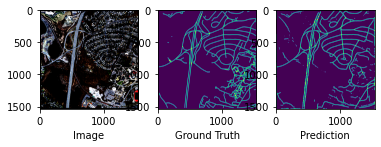

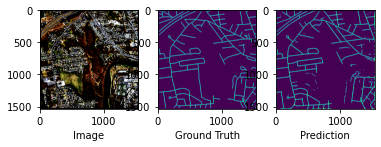

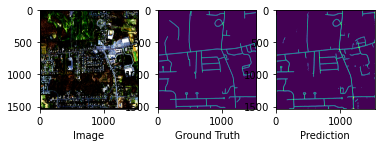

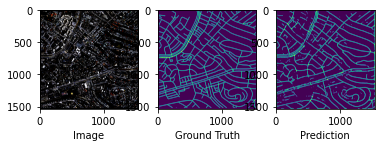

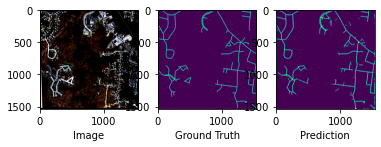

...

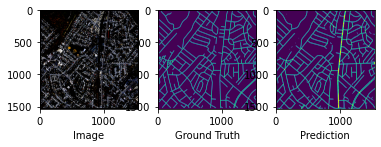

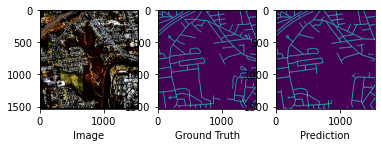

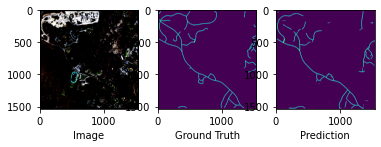

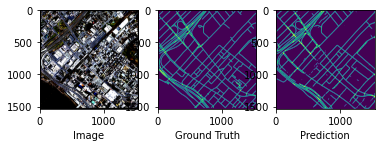

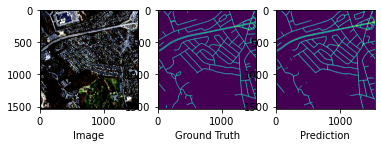

In [19]:
train_loss_values = []
valid_loss_values = []
train_iou_values = []
valid_iou_values = []

for epoch in range(200):
    loop = tqdm(train_loader)
    train_losses = []
    train_iou = []
    # training_loop
    model.train()
    for batch_id, (images, masks) in enumerate(loop):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float().unsqueeze(1)
        
        outputs = model(images)
        

        loss = criterion(outputs, masks)
        train_losses.append(loss.item())
        
        iou = mIoU(outputs, masks)
        train_iou.append(iou)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loop.set_postfix(train_loss=loss.item(), train_miou=iou)
        
    # Validation loop    
    model.eval()
    valid_losses = []
    valid_iou = []

    with torch.no_grad():
        loop = tqdm(valid_loader)
        for i, (images, masks) in enumerate(loop):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            masks = masks.float().unsqueeze(1)

            outputs = model(images)
            
            if (epoch+1) % 10 == 0:
                img = images[0].permute(1, 2, 0).cpu()
                mask = masks[0].squeeze(0).cpu()
                preds = torch.sigmoid(outputs)
                preds = (preds > 0.5).float()
                pred = preds[0].cpu().squeeze(0)

                plot_images(img, mask, pred)
            
            val_loss = criterion(outputs, masks)
            valid_losses.append(val_loss.item())

            val_iou = mIoU(outputs, masks)
            valid_iou.append(val_iou)
            
            loop.set_postfix(valid_loss=val_loss.item(), valid_miou=val_iou)
                
        
        
    scheduler.step()
        
    train_loss_values.append(np.mean(train_losses))
    valid_loss_values.append(np.mean(valid_losses))
    train_iou_values.append(np.mean(train_iou))
    valid_iou_values.append(np.mean(valid_iou))
    
    
    if (epoch+1) % 10 == 0:
        torch.save(model.state_dict(), "B_Small.pt")
        
        
        
        
    print(f"Epoch-{epoch+1} Train mean loss: {np.mean(train_losses):.4f} Train MIOU: {np.mean(train_iou):.4f}")
    print(f"Epoch-{epoch+1} Valid mean loss: {np.mean(valid_losses):.4f} Valid MIOU: {np.mean(valid_iou):.4f}")

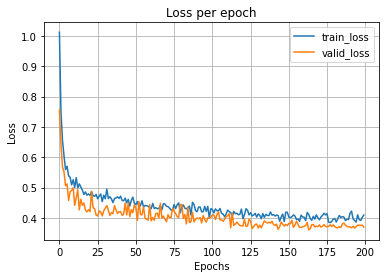

In [20]:
#Plotting Loss
plt.plot(train_loss_values, label='train_loss')
plt.plot(valid_loss_values, label='valid_loss')
plt.title('Loss per epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

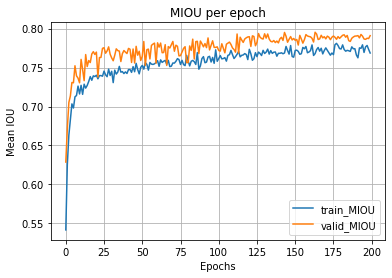

In [21]:
# Plotting Mean IOU
plt.plot(train_iou_values, label='train_MIOU')
plt.plot(valid_iou_values, label='valid_MIOU')
plt.title('MIOU per epoch')
plt.xlabel('Epochs')
plt.ylabel('Mean IOU')
plt.legend()
plt.grid()
plt.show()

In [19]:
# inference_model = ConvMixer_UNET_down(CLASSES).to(DEVICE)
weights = torch.load("B_Small.pt")
model.load_state_dict(weights)



def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy


model.eval()
with torch.no_grad():
    total_list = []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).squeeze(1).long()
        
        outputs = model(images)
        miou_list = mIoU(pred_mask = outputs, mask=masks, n_classes=2) 
        total_list.append(miou_list)
print(np.mean(total_list))

  0%|          | 0/25 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 25/25 [00:31<00:00,  1.26s/it]

0.8136872453907066


In [20]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor
unnorm = UnNormalize(mean=[0.4299, 0.4328, 0.3964], std=[0.2711, 0.2666, 0.2816])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

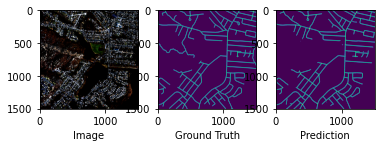

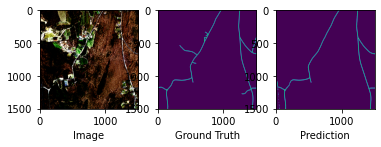

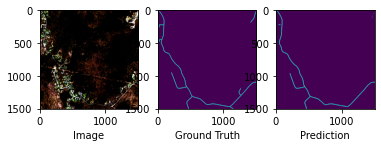

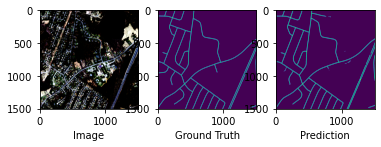

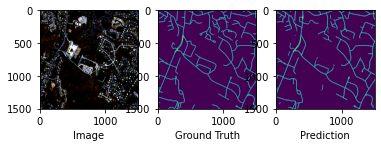

...

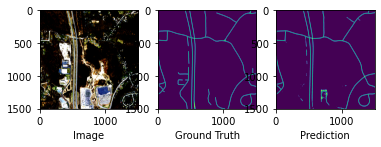

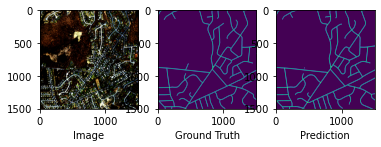

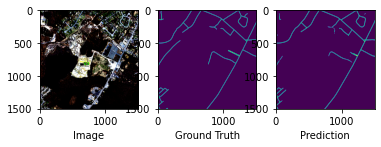

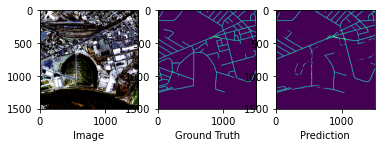

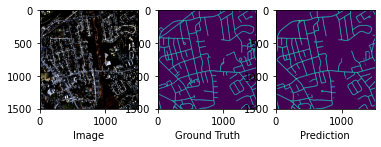

In [21]:
with torch.no_grad():
    model.eval()
    folder = 'Image_results/Model_B'
    for i, data in enumerate(test_set):
        images, masks = data
        images = images.unsqueeze(0).to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float()

        outputs = model(images)

        img = images.squeeze(0).permute(1, 2, 0).cpu()
        mask = masks.squeeze(0).cpu()
        preds = torch.sigmoid(outputs)
        preds = (preds > 0.5).float()
        pred = preds[0].cpu().squeeze(0)
        pred[pred == 1] = 255
        
        image = unnorm(images)
        torchvision.utils.save_image(image, f"{folder}/image_{i}.png")
        torchvision.utils.save_image(masks, f"{folder}/mask_{i}.png")
        torchvision.utils.save_image(pred, f"{folder}/pred_{i}.png")

        plot_images(img, mask, pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


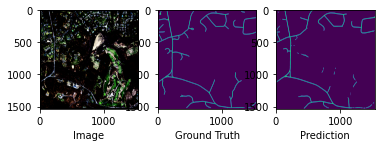

In [32]:
with torch.no_grad():
    model.eval()
    images, masks = test_set[23]
    images = images.unsqueeze(0).to(DEVICE)
    masks = masks.to(DEVICE)
    masks = masks.float()

    outputs = model(images)

    img = images.squeeze(0).permute(1, 2, 0).cpu()
    mask = masks.squeeze(0).cpu()
    preds = torch.sigmoid(outputs)
    preds = (preds > 0.5).float()
    pred = preds[0].cpu().squeeze(0)

    plot_images(img, mask, pred)
   

In [20]:
# Image size = 1536
import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images).squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 25/25 [01:30<00:00,  3.62s/it]

 MIOU: 0.8038362253176798, P: 0.8941751718521118, R: 0.8701703548431396, F1: 0.880354106426239


In [22]:
# Image size = 1504

import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images).squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 25/25 [01:32<00:00,  3.68s/it]

 MIOU: 0.8158806675319843, P: 0.9032920598983765, R: 0.8742645978927612, F1: 0.8869574666023254


In [19]:
# Image size = 1504

# inference_model = ConvMixer_UNET_down(CLASSES).to(DEVICE)
weights = torch.load("B_Small.pt")
model.load_state_dict(weights)

import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images).squeeze(1)
        outputs = outputs[:, 26 :1526, 26 :1526]
        masks = masks[:, 26 :1526, 26 :1526]
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

  0%|          | 0/25 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 25/25 [01:33<00:00,  3.73s/it]

 MIOU: 0.813545676288677, P: 0.9061437845230103, R: 0.8708650469779968, F1: 0.8863199353218079


In [ ]:
from torchinfo import summary
